**AUTOR:** IAGO HENRIQUE DE OLIVEIRA


**CONTATO:** https://www.linkedin.com/in/iagohenrique/

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sbn
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MaxAbsScaler, OneHotEncoder
from sklearn.metrics import accuracy_score, cohen_kappa_score, mean_squared_error, mean_absolute_error, make_scorer, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, Lasso, LassoCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn import svm
from sklearn import tree
import warnings as wr
wr.filterwarnings('ignore')

In [ ]:
def abrir_dataset(dados, delimitador):
  dataframe = pd.read_csv(dados, delimiter=delimitador)
  return dataframe

In [ ]:
#Exibe o tipo das variáveis.
def visualizar_tipo(dataframe): 
  data_type = dataframe.dtypes
  data_type = pd.DataFrame(data_type)
  return data_type.head(len(data_type))

In [ ]:
#Exibe quantidade de valores nulos por variável
def verificar_nulos(dataframe):
  d_null = dataframe.isnull().sum()
  d_null = pd.DataFrame(d_null)
  return d_null.head(len(d_null))

In [ ]:
#Função para normalizar dados através de dois métodos: metodo_norm = 'a' -> MaxAbsScaler | metodo_norm = 'b' -> StandardScaler. 
def normalizar_dados(dataframe, dados_treino, dados_teste, metodo_norm):
    if(metodo_norm == 'a'):
      NORM=MaxAbsScaler()
    else:
      NORM=StandardScaler()
    treino = NORM.fit_transform(dados_treino)
    teste = NORM.transform(dados_teste)
    return treino, teste

In [ ]:
#Função para obter a acurácia e coeficiente de kappa
def get_acuracia(modelo, x_teste, y_teste):
  predicao = modelo.predict(x_teste)
  acuracia = accuracy_score(y_teste, predicao)
  kappa = cohen_kappa_score(y_teste, predicao)
  print("| " + "ACURACIA = %f" % (acuracia) + " | " + "KAPPA = %f" % (kappa) + " |")

In [ ]:
#Função para calcular a raiz do erro quadrático médio
def get_rmse(model, x_teste, y_teste):
  y_pred = model.predict(x_teste)
  rmse = np.sqrt(mean_squared_error(y_teste, y_pred))
  mae = mean_absolute_error(y_teste, y_pred)
  print("| " + "RMSE = %f" % (rmse) + " | " + "MAE = %f" % (mae) + " |")

#1 - AGRUPAMENTO.CSV

In [ ]:
#Abrindo o dataset agrupamento.csv
df_um = abrir_dataset('agrupamento.csv', ',')

In [ ]:
 #Exibindo as tres primeiras linhas do dataframe.
df_um.head(3)

,x0,x1,x2,x3,x4
0,5.447043,6.319084,2.664620,6.568743,4.802295
1,4.875562,4.796801,2.154231,6.832907,5.321401
2,5.582920,5.060775,1.895917,6.004299,6.330105


In [ ]:
#Exibindo o tipo das variáveis.
visualizar_tipo(df_um)

,0
x0,float64
x1,float64
x2,float64
x3,float64
x4,float64


Todas as variáveis possuem valores do tipo float.

In [ ]:
#Verificando se existem valores nulos.
verificar_nulos(df_um)

,0
x0,0
x1,0
x2,0
x3,0
x4,0


Como pode ser observado, não existem valores nulos no dataset agrupamento.csv

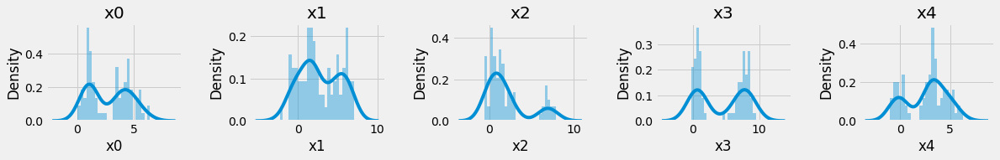

In [ ]:
#Plotando o gráfico da representação da distribuição dos dados do dataset agrupamento.csv. 

plt.style.use('fivethirtyeight')

plt.figure(1, figsize=(18,2))
n = 0
for x in ['x0', 'x1', 'x2', 'x3', 'x4']:
  n = n + 1
  plt.subplot(1, 5, n)
  plt.subplots_adjust(hspace = 0.5, wspace=0.5)
  sbn.distplot(df_um[x], bins = 25)
  plt.title('{}'.format(x))
plt.show()

Os gráficos mostraram uma distribuição bimodal, uma vez que duas curvas curvas são apresentadas. Em outras palavras, existem duas modas diferentes. Este é um caso no qual existem duas amostras diferentes.

**K-MEANS** - **UMA BREVE DESCRIÇÃO DOS PARÂMETROS**:

* **n_clusters**: número de clusters;

* **init**: modo no qual o algoritmo será inicializado;

* **k-means++**: método padrão, no qual os centroides são gerados por meio de um método inteligente que proporciona uma maior convergência;

* **random**: os centroides são gerados de maneira aleatória;

* **ndarray**: array de centroides que o algoritmo pode utilizar;

* **max_iter**: número máximo de iterações que o algoritmo deve realizar;

* **n_jobs**: numéro de CPUs para executar o K-MENS;

* **inertia**: soma das distâncias quadráticas intra cluster;

* **labels_**: rótulos dos clusters;

* **cluster_centers_**: valores dos centroides.

In [ ]:
#Executando o K-MEANS com diferentes quantidades de clusters e, ao mesmo tempo, adicionando o resultado da inertia em uma lista
list_inertia = []
for n in range(1, 10):
  kmeans = (KMeans(n_clusters= n))
  kmeans.fit(df_um)
  list_inertia.append(kmeans.inertia_)

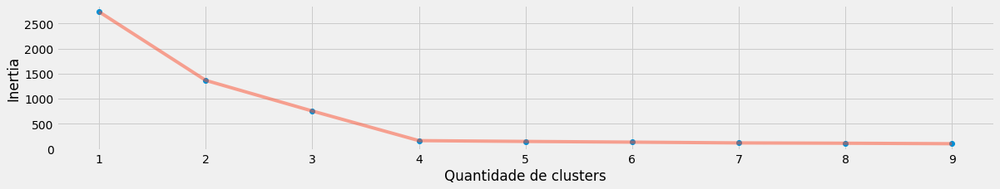

In [ ]:
#Plotando o gráfico da influência do número de clusters no resultado da inertia.
plt.figure(1, figsize = (18, 3))
plt.plot(np.arange(1, 10), list_inertia, 'o')
plt.plot(np.arange(1, 10), list_inertia, '-', alpha = 0.5)
plt.xlabel('Quantidade de clusters'), plt.ylabel('Inertia')
plt.show()

Utilizando o método elbow, que realiza a soma das distâncias quadráticas intra clusters, foi possível identificar o número ideal de clusters.

Utilizando este método, foi possível observar que **quatro cluters é o número ideal**.

In [ ]:
#Utilizando o K-MEANS e fazendo o agrupamento com quatro clusters, que foi o número ideal encontrado na etapa anterior.
kmeans_md = (KMeans(n_clusters=4))
kmeans_md.fit(df_um)
y_kmeans = kmeans_md.predict(df_um)

**Plotando o resultado**

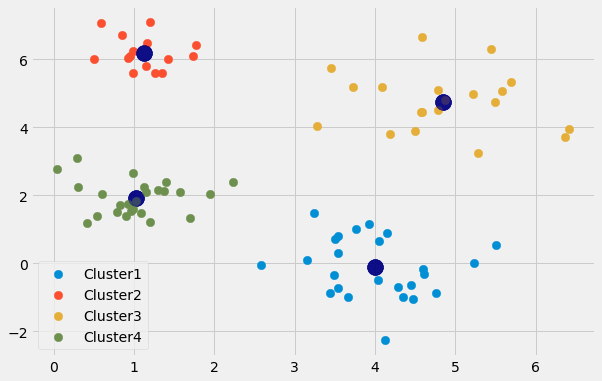

In [ ]:
plt.figure(figsize=(9,6))

colours = ['red','blue','green','magenta']
for i in range(4):
    plt.scatter(df_um.iloc[y_kmeans == i, 0], df_um.iloc[y_kmeans == i, 1], s = 70, cmap='viridis', label = 'Cluster'+str(i+1))
    plt.scatter(kmeans_md.cluster_centers_[:, 0], kmeans_md.cluster_centers_[:, 1], c='navy', s=250, alpha=0.5);
plt.legend( )

#2 - CLASSIFICACAO_Q1.CSV

In [ ]:
#Abrindo o dataset classificacao_Q1.csv
df_dois = abrir_dataset('classificacao_Q1.csv', ',')

In [ ]:
#Exibindo as tres primeiras linhas do dataframe.
df_dois.head(3)

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,target
0,-1.79796,-1.75901,-2.14257,-0.01878,-0.58601,-3.08224,-1.71369,1.41805,2.29783,1.11745,-3.43483,1.94926,0
1,-2.78612,-1.60622,-4.05247,3.33814,1.44255,-3.95343,-3.32328,0.71019,2.31973,0.57596,-4.22278,0.51171,0
2,-1.31957,2.61125,-0.99663,0.34752,0.85253,4.22652,0.84765,0.88530,-1.01460,1.03488,-0.84593,2.64307,1


In [ ]:
#Exibindo o tipo das variáveis.
visualizar_tipo(df_dois)

,0
v_1,float64
v_2,float64
v_3,float64
v_4,float64
v_5,float64
v_6,float64
v_7,float64
v_8,float64
v_9,float64
v_10,float64


Como pode ser obervado, as variáveis são do tipo float e o target do tipo int.

In [ ]:
#Verificando se existem valores nulos.
verificar_nulos(df_dois)

,0
v_1,0
v_2,0
v_3,0
v_4,0
v_5,0
v_6,0
v_7,0
v_8,0
v_9,0
v_10,0


Foi possível observar que não existem valores nulos no dataset classificacao_Q1.csv

In [ ]:
#Tabela de percentis, visando uma melhor melhor análise dos dados.
df_dois.describe(percentiles=[0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99])

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,target
count,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000
mean,-0.511946,0.029368,0.102888,-0.157062,-1.061615,-1.202088,-0.557339,0.706537,0.486094,-0.649257,-0.642308,0.026067,0.550556
std,3.157810,1.751569,2.003690,1.611714,1.426915,2.053804,1.632385,2.726397,1.644239,1.855859,1.869548,1.524047,0.497576
min,-12.525340,-5.231960,-6.597090,-4.896670,-5.867850,-6.448870,-5.652650,-7.760350,-4.825480,-6.512840,-7.047690,-4.202530,0.000000
25%,-2.680907,-1.168230,-1.179710,-1.274385,-2.003583,-2.624455,-1.718805,-1.284353,-0.586963,-1.936177,-1.865870,-1.096765,0.000000
50%,-0.593210,-0.082700,0.148440,-0.242765,-1.066085,-1.328955,-0.562480,0.884630,0.569110,-0.541495,-0.555150,-0.029350,1.000000
75%,1.801338,1.262868,1.509780,0.938377,-0.128780,0.092840,0.569145,2.811808,1.632197,0.682680,0.694340,1.141643,1.000000
80%,2.270806,1.551900,1.765266,1.232390,0.077044,0.455130,0.825446,3.160912,1.869916,0.941930,0.963462,1.386888,1.000000
90%,3.547397,2.314880,2.646112,1.929842,0.757103,1.438936,1.604675,4.138098,2.500043,1.635097,1.676995,2.049902,1.000000
95%,4.555152,2.927177,3.286734,2.503973,1.327326,2.432767,2.146478,4.820266,3.041357,2.197868,2.245780,2.527861,1.000000


O resultados apresentados através dos percentis não permitem a identificação de outliers, ou seja, valores fora do normal. Portanto, nenhuma ação será realizada para resolver problemas desta natureza.

1    991
0    809
Name: target, dtype: int64


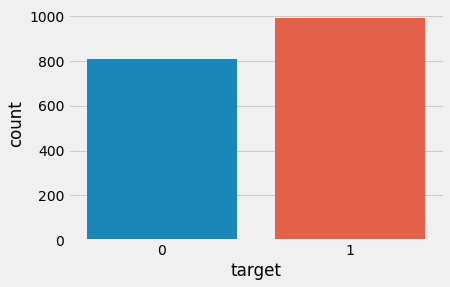

In [ ]:
#Verificando se as classes são desbalanceadas.
print(pd.Series(df_dois.target).value_counts())
sbn.countplot(df_dois.target);

Através do gráfico acima, pode-se observar que existe um desbalanceamento entre as classes. Após a modelagem dos dados, utilizarei algumas técnicas visando a solução deste problema.

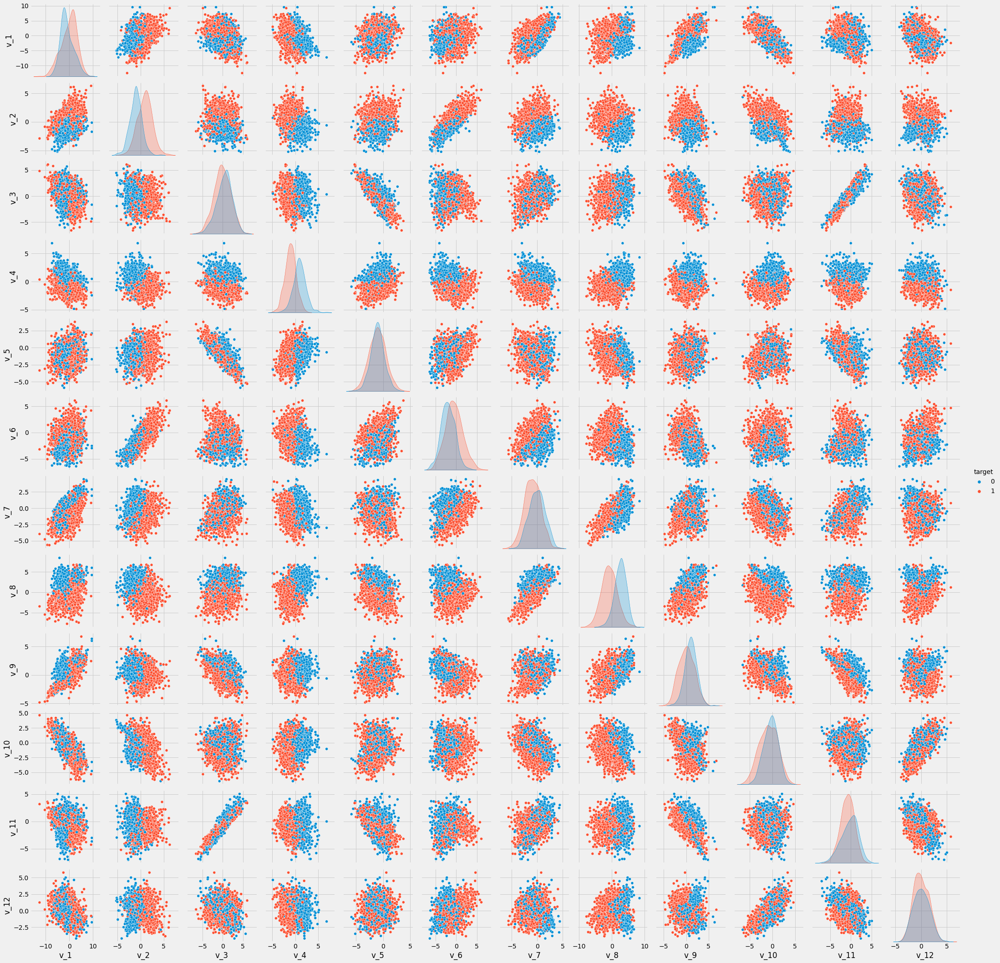

In [ ]:
#Exibição de um pairplot
df_dois['target'].unique()
sbn.pairplot(df_dois, hue='target')
plt.show()

Através deste pairplot, foi possível identificar que algumas variavés sozinhas já conseguem explicar os targets. Por meio dos gráficos foi possível observar que as variáveis v_2, v_4 e v_8, conseguem explicar os targets. 

Fazendo o uso de modelos como svm, random forest e árvore de decisão, testei cada uma destas três variáveis (v_2, v_4 e v_8) individualmente e, também, as três em conjunto. Utilizando as variáveis individualmente, foi prossível classificar os targets com uma acurácia razoavelmente boa. Utilizando as três variáveis em conjunto, foi possível alcançar acurácias acima de 0.80 ou acima de 0.90 dependendo do modelo.

Porém, não se sabe previamente se os modelos conseguirão maiores taxas de acerto através da combinação de todas as variáveis.

**FUNÇÃO MODELO:** DECISION TREE - COM GRID SEARCH

In [ ]:
def treinar_tree_grid(x_train, y_train):
  tree_parametros = {'criterion':['gini','entropy', 'misclassification'], 'max_depth':[2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 20, 30, 40, 50, 75, 100]}
  model_tree = GridSearchCV(tree.DecisionTreeClassifier(), tree_parametros, cv=5)
  model_tree.fit(x_train, y_train)
  print("TREE - GRID SEARCH - MELHOR CONFIG: " + str(model_tree.best_params_))
  return model_tree.best_estimator_

**FUNÇÃO MODELO:** RANDOM FOREST - COM GRID SEARCH

In [ ]:
def treinar_rf_grid(x_train, y_train):
  rf_parametros = {'n_estimators': [50, 100, 250, 500], 'max_depth': [None, 1, 2, 3], 'min_samples_split': [1, 2, 3], 'max_features': ['auto', 'sqrt']}
  model_rf = GridSearchCV(RandomForestClassifier(), rf_parametros, cv=5,  n_jobs=-1, verbose=0)
  model_rf.fit(x_train, y_train)
  print("RF - GRID SEARCH - MELHOR CONFIG: " + str(model_rf.best_params_))
  return model_rf.best_estimator_

**FUNÇÃO DO MODELO:** SVC - COM GRID SEARCH

In [ ]:
def treinar_svc_grid(x_train, y_train):
  svc_parametros = {'C': [0.1, 0.5, 1, 2, 10, 100, 1000], 'gamma': [1, 0.5, 0.1, 0.01, 0.001, 0.0001],'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}
  model_svc = GridSearchCV(svm.SVC( ), svc_parametros, refit=True,verbose=0)
  model_svc.fit(x_train, y_train)
  print("SVC - GRID SEARCH - MELHOR CONFIG: " + str(model_svc.best_params_))
  return model_svc.best_estimator_

**TESTANDO OS MODELOS, FAZENDO USO DAS TRÊS VARIÁVEIS (FEATURES v_2, v_4 e v_8) QUE MELHOR EXPLICAM OS TARGETS**

In [ ]:
#Separando as variáveis (features) e os targets (classes). 
#Neste caso, criei um dataframe, chamado de x_tres, que possui as três variáveis que melhor explicam os targets.

y_tres = df_dois['target']
x_tres = pd.DataFrame({'v_2':df_dois['v_2'], 'v_4':df_dois['v_4'], 'v_8':df_dois['v_8']})
variaveis_tres = x_tres.columns

In [ ]:
#Divide os dados em conjunto de treino (75%) e conjunto de teste (25%)
x_train_tres, x_test_tres, y_train_tres, y_test_tres = train_test_split(x_tres, y_tres, test_size = 0.25, stratify=y)

In [ ]:
#Normaliza os dados das features
x_train_tres, x_test_tres = normalizar_dados(df_dois, x_train_tres, x_test_tres, 'a')

1    743
0    607
Name: target, dtype: int64


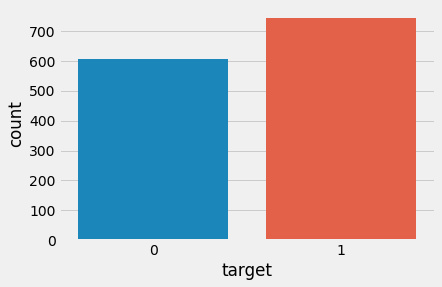

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino
print(pd.Series(y_train_tres).value_counts())
sbn.countplot(y_train_tres);

Como as classes estão desbalanceadas, será aplicado o método under-sampling para fazer este balanceamento. No entanto, este método será aplicado apenas no conjunto de treino, para que as características originais do teste não sejam desconfiguradas.

In [ ]:
random_under_sampler = RandomUnderSampler()
x_train_tres, y_train_tres = random_under_sampler.fit_sample(x_train_tres, y_train_tres)

1    607
0    607
dtype: int64


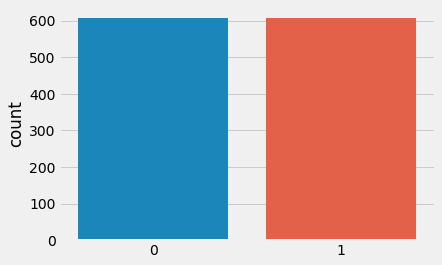

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino, após a aplicação do método random under sampler
print(pd.Series(y_train).value_counts())
sbn.countplot(y_train);

Pode-se observar que os dados do conjunto de treino, foram balanceados.

**TESTANDO OS MODELOS COM AS TRÊS VARIÁVEIS (FEATURES)**



*   **RESULTADO**: DECISION TREE - USANDO TRÊS VARIÁVEIS COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_tree = treinar_tree_grid(x_train_tres, y_train_tres) 

TREE - GRID SEARCH - MELHOR CONFIG: {'criterion': 'gini', 'max_depth': 5}


In [ ]:
get_acuracia(model_tree, x_test_tres, y_test_tres)

| ACURACIA = 0.877778 | KAPPA = 0.753540 |


*   **RESULTADO**: RANDOM FOREST - USANDO TRÊS VARIÁVEIS COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_rf = treinar_rf_grid(x_train_tres, y_train_tres)

RF - GRID SEARCH - MELHOR CONFIG: {'max_depth': 3, 'max_features': 'auto', 'min_samples_split': 3, 'n_estimators': 250}


In [ ]:
get_acuracia(model_rf, x_test_tres, y_test_tres)

| ACURACIA = 0.895556 | KAPPA = 0.788614 |


*   **RESULTADO**: SVC - USANDO TRÊS VARIÁVEIS COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_svc = treinar_svc_grid(x_train_tres, y_train_tres)

SVC - GRID SEARCH - MELHOR CONFIG: {'C': 10, 'gamma': 0.5, 'kernel': 'rbf'}


In [ ]:
get_acuracia(model_svc, x_test_tres, y_test_tres)

| ACURACIA = 0.902222 | KAPPA = 0.802561 |


**TESTANDO OS MODELOS, FAZENDO USO DE TODAS AS VARIÁVEIS PARA VERIFICAR SE A COMBINAÇÃO MELHORA OS RESULTADOS**

In [ ]:
y_all = df_dois['target']
df_dois.drop(columns=['target'], inplace=True)
x_all = df_dois.iloc[:,:]
variaveis_all = df_dois.columns

In [ ]:
x_train_all, x_test_all, y_train_all, y_test_all = train_test_split(x_all, y_all, test_size = 0.25, stratify=y)

In [ ]:
#Normaliza os dados das features
x_train_all, x_test_all = normalizar_dados(df_dois, x_train_all, x_test_all, 'a')

1    743
0    607
Name: target, dtype: int64


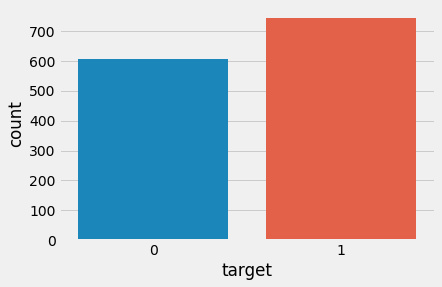

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino
print(pd.Series(y_train_all).value_counts())
sbn.countplot(y_train_all);

In [ ]:
random_under_sampler = RandomUnderSampler()
x_train_all, y_train_all = random_under_sampler.fit_sample(x_train_all, y_train_all)

1    607
0    607
dtype: int64


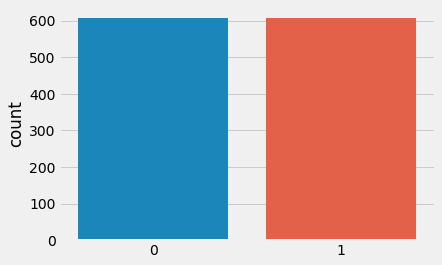

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino, após a aplicação do método random under sampler
print(pd.Series(y_train_all).value_counts())
sbn.countplot(y_train_all);

**TESTANDO OS MODELOS COM TODAS AS VARIÁVEIS (FEATURES)**



*   **RESULTADO**: DECISION TREE - USANDO TODAS VARIÁVEIS COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.



In [ ]:
model_tree = treinar_tree_grid(x_train_all, y_train_all) 

TREE - GRID SEARCH - MELHOR CONFIG: {'criterion': 'gini', 'max_depth': 12}


In [ ]:
get_acuracia(model_tree, x_test_all, y_test_all)

| ACURACIA = 0.882222 | KAPPA = 0.762066 |


*   **RESULTADO**: RANDOM FOREST - USANDO TODAS VARIÁVEIS COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_rf = treinar_rf_grid(x_train_all, y_train_all)

RF - GRID SEARCH - MELHOR CONFIG: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_split': 3, 'n_estimators': 250}


In [ ]:
get_acuracia(model_rf, x_test_all, y_test_all)

| ACURACIA = 0.951111 | KAPPA = 0.901371 |


*   **RESULTADO**: SVC - USANDO TODAS VARIÁVEIS COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_svc = treinar_svc_grid(x_train_all, y_train_all)

SVC - GRID SEARCH - MELHOR CONFIG: {'C': 2, 'gamma': 1, 'kernel': 'rbf'}


In [ ]:
get_acuracia(model_svc, x_test_all, y_test_all)

| ACURACIA = 0.966667 | KAPPA = 0.932598 |


**CONCLUSÃO**: Dentre os modelos testados, foi possível observar que o SVC apresentou a maior acurácia. Random Forest e Decision Tree apresentaram, respectivamente, segundo e terceiro melhor resultado. 

Através do pairplot foi possível identificar as três principais variáveis, que melhor explicam os targets. No entanto, ao testar os modelos utilizado todas as variáveis, obteve-se uma maior acurácia. Contudo, houve a diferença de percentual foi pequena. Isso é interessante, pois em problemas que existem restrição de tempo, usar uma menor quantidade de variáveis ajudará na redução do tempo de processamento.

#3 - CLASSIFICACAO_Q2.CSV

In [ ]:
#Abrindo o dataset classificacao_Q2.csv
df_tres = abrir_dataset('classificacao_Q2.csv', ',')

In [ ]:
#Exibindo as tres primeiras linhas do dataframe.
df_tres.head(3)

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,target
0,-1.39917,0.96108,-0.36145,0.26092,2.78953,-1.55046,-0.79886,0.24304,1.51733,-0.03357,-1.51127,-0.97444,-0.01934,0
1,-2.48564,1.24529,-0.39431,1.06648,1.71957,-0.60296,-2.35698,-2.31878,0.95555,-2.00420,-0.75294,-3.64680,-0.55923,0
2,-0.57025,0.65495,-0.73706,0.22444,-0.44094,-0.42596,0.44267,-1.74196,-0.06599,-0.36783,0.93065,-0.72392,0.37139,0


In [ ]:
#Exibindo o tipo das variáveis.
visualizar_tipo(df_tres)

,0
v_1,float64
v_2,float64
v_3,float64
v_4,float64
v_5,float64
v_6,float64
v_7,float64
v_8,float64
v_9,float64
v_10,float64


Como pode ser obervado, as variáveis são do tipo float e o target do tipo int.

In [ ]:
#Verificando se existem valores nulos.
verificar_nulos(df_tres)

,0
v_1,0
v_2,0
v_3,0
v_4,0
v_5,0
v_6,0
v_7,0
v_8,0
v_9,0
v_10,0


Foi possível observar que não existem valores nulos no dataset classificacao_Q2.csv

In [ ]:
#Tabela de percentis, visando uma melhor melhor análise dos dados.
df_tres.describe(percentiles=[0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99])

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,target
count,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000
mean,-0.011401,-0.003090,-0.521638,0.971021,-0.741765,1.086300,-0.572599,-0.758578,0.499644,-0.995828,-0.001985,-1.256229,0.012317,0.50320
std,1.677724,2.008608,1.750185,2.329727,2.561613,2.723206,1.570978,2.877406,1.605483,1.321889,1.702620,2.789631,0.990658,0.50009
min,-4.711120,-7.169570,-5.686860,-9.185750,-7.675560,-9.780180,-7.518820,-10.923700,-5.038580,-5.895320,-4.569390,-10.394380,-3.362940,0.00000
25%,-1.238582,-1.376815,-1.728730,-0.477980,-2.795508,-0.694562,-1.583137,-2.605395,-0.602595,-1.845885,-1.254970,-3.257135,-0.675635,0.00000
50%,-0.079395,0.116060,-0.644290,1.066820,-0.839305,1.292615,-0.399600,-0.812185,0.566005,-0.992885,-0.218980,-1.347365,0.011045,1.00000
75%,1.117717,1.368095,0.534890,2.559653,1.012323,2.954100,0.523932,1.180462,1.580725,-0.144530,1.122950,0.599712,0.665195,1.00000
80%,1.435330,1.705410,0.868938,2.855712,1.442060,3.366260,0.744278,1.736224,1.855062,0.082388,1.415240,1.066742,0.857822,1.00000
90%,2.227074,2.582462,1.817900,3.860516,2.654112,4.366484,1.295394,2.926555,2.526602,0.706258,2.354338,2.508432,1.305885,1.00000
95%,2.960987,3.313246,2.667458,4.661938,3.746014,5.274388,1.787175,3.965755,3.076661,1.130545,3.085024,3.510512,1.626652,1.00000


O resultados apresentados através dos percentis não permitem a identificação de outliers.

1    1258
0    1242
Name: target, dtype: int64


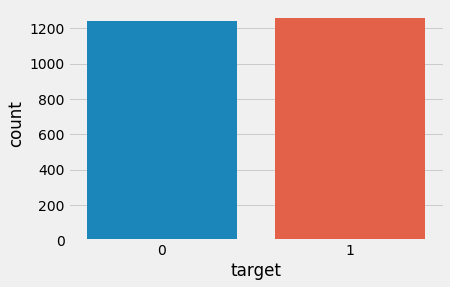

In [ ]:
#Verificando se as classes são desbalanceadas.
print(pd.Series(df_tres.target).value_counts())
sbn.countplot(df_tres.target);

Como o desbalanceamento entre as classes é bem pequeno, torna-se necessário olhar com mais atenção para o gráfico. Além de apresentar o gráfico, também mostrei uma mensagem na tela, descrevendo a quantidade de cada classe. Com isso, pode-se observar que, numericamente, existe um pequeno desbalanceamento.

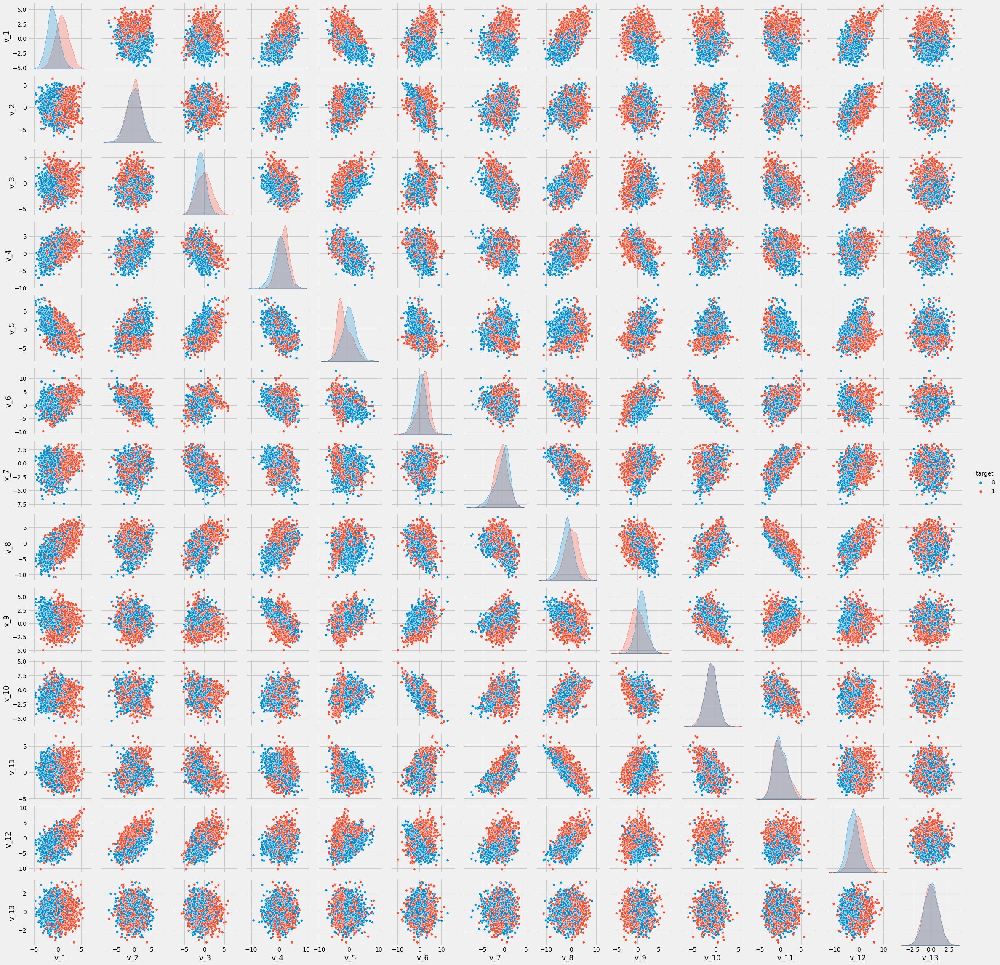

In [ ]:
#Exibição de um pairplot
df_tres['target'].unique()
sbn.pairplot(df_tres, hue='target')
plt.show()

Através deste pairplot é difícil identificar muitas variáveis que sozinhas coseguem explicar os targets. No entanto, pode-se observar que a variável v_1 apresenta grandes chances para explicar os targets. Fazendo um pouco de esforço na observação, podemos dizer que variáveis como v_3, v_5, v_6 e v_9, podem ser razoavelmente boas para explicar os targets. No entanto, são são tão boas quanto v_1. Realizando testes, torna-se possível a verificação do potencial destas variáveis. 

**PREPARAÇÃO DOS DADOS PARA TESTAR OS MODELOS COM UMA VARIÁVEL (v_1)**

In [ ]:
y_um = yy = df_tres['target']
x_um = pd.DataFrame({'v_1':df_tres['v_1']})

In [ ]:
x_train_um, x_test_um, y_train_um, y_test_um = train_test_split(x_um, y_um, test_size = 0.25)

In [ ]:
#Normaliza os dados das features
x_train_um, x_test_um = normalizar_dados(df_tres, x_train_um, x_test_um, 'a')

0    938
1    937
Name: target, dtype: int64


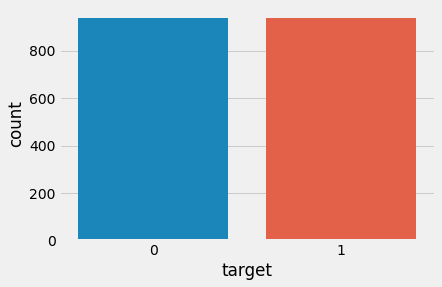

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino
print(pd.Series(y_train_um).value_counts())
sbn.countplot(y_train_um);

Praticamente não houve desbalanceamento entre as classes. Portanto, não irei aplicar nenhum método.

**TESTANDO OS MODELOS APENAS COM A VARIÁVEL V_1, POIS INDENTIFIQUEI ATRAVÉS DO PLAIRPLOT QUE ELA POSSUI POTENCIAL PARA EXPLICAR OS TARGETS**



*   **RESULTADO**: DECISION TREE - USANDO APENAS A VARIÁVEL V_1 COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.



In [ ]:
model_tree = treinar_tree_grid(x_train_um, y_train_um) 

TREE - GRID SEARCH - MELHOR CONFIG: {'criterion': 'entropy', 'max_depth': 4}


In [ ]:
get_acuracia(model_tree, x_test_um, y_test_um)

| ACURACIA = 0.764800 | KAPPA = 0.529539 |


*   **RESULTADO**: RANDOM FOREST - USANDO APENAS A VARIÁVEL V_1 COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_rf = treinar_rf_grid(x_train_um, y_train_um)

RF - GRID SEARCH - MELHOR CONFIG: {'max_depth': 3, 'max_features': 'auto', 'min_samples_split': 3, 'n_estimators': 100}


In [ ]:
get_acuracia(model_rf, x_test_um, y_test_um)

| ACURACIA = 0.764800 | KAPPA = 0.529539 |


*   **RESULTADO**: SVC - USANDO APENAS A VARIÁVEL V_1 COM BASE NA INTERPRETAÇÃO DO PAIRPLOT.

In [ ]:
model_svc = treinar_svc_grid(x_train_um, y_train_um)

SVC - GRID SEARCH - MELHOR CONFIG: {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}


In [ ]:
get_acuracia(model_svc, x_test_um, y_test_um)

| ACURACIA = 0.780800 | KAPPA = 0.561848 |


**PREPARAÇÃO DOS DADOS PARA TESTAR OS MODELOS COM SEIS VARIÁVEIS (v_1, v_3, v_5, v_6 e v_9)**

In [ ]:
y_seis = yy = df_tres['target']
x_seis = pd.DataFrame({'v_1':df_tres['v_1'], 'v_3':df_tres['v_3'], 'v_5':df_tres['v_5'], 'v_6':df_tres['v_6'], 'v_9':df_tres['v_9']})

In [ ]:
x_train_seis, x_test_seis, y_train_seis, y_test_seis = train_test_split(x_seis, y_seis, test_size = 0.25)

In [ ]:
#Normaliza os dados das features
x_train_seis, x_test_seis = normalizar_dados(df_tres, x_train_seis, x_test_seis, 'a')

1    941
0    934
Name: target, dtype: int64


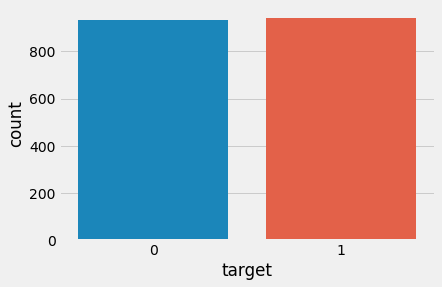

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino
print(pd.Series(y_train_seis).value_counts())
sbn.countplot(y_train_seis);

Após idenficar as classes minimamente desbalanceadas, foi utilizado o random under sampler para fazer o balanceamento.

In [ ]:
random_under_sampler = RandomUnderSampler()
x_train_seis, y_train_seis = random_under_sampler.fit_sample(x_train_seis, y_train_seis)

1    934
0    934
dtype: int64


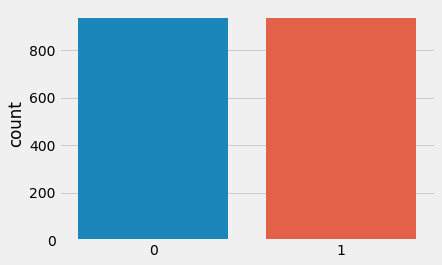

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino, após a aplicação do método random under sampler
print(pd.Series(y_train_seis).value_counts())
sbn.countplot(y_train_seis);

**TESTANDO OS MODELOS COM AS SEIS VARIÁVEIS (FEATURES)**



*   **RESULTADO**: DECISION TREE - USANDO SEIS VARIÁVEIS.


In [ ]:
model_tree = treinar_tree_grid(x_train_seis, y_train_seis) 

TREE - GRID SEARCH - MELHOR CONFIG: {'criterion': 'gini', 'max_depth': 5}


In [ ]:
get_acuracia(model_tree, x_test_seis, y_test_seis)

| ACURACIA = 0.825600 | KAPPA = 0.651079 |


*   **RESULTADO**: RANDOM FOREST - USANDO SEIS VARIÁVEIS.

In [ ]:
model_rf = treinar_rf_grid(x_train_seis, y_train_seis)

RF - GRID SEARCH - MELHOR CONFIG: {'max_depth': None, 'max_features': 'auto', 'min_samples_split': 3, 'n_estimators': 250}


In [ ]:
get_acuracia(model_rf, x_test_seis, y_test_seis)

| ACURACIA = 0.867200 | KAPPA = 0.734137 |


*   **RESULTADO**: SVC - USANDO SEIS VARIÁVEIS.

In [ ]:
model_svc = treinar_svc_grid(x_train_seis, y_train_seis)

SVC - GRID SEARCH - MELHOR CONFIG: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}


In [ ]:
get_acuracia(model_svc, x_test_seis, y_test_seis)

| ACURACIA = 0.910400 | KAPPA = 0.820631 |


**PREPARAÇÃO DOS DADOS PARA TESTAR OS MODELOS COM TODAS AS VARIÁVEIS**

In [ ]:
y_full = df_tres['target']
df_tres.drop(columns=['target'], inplace=True)
x_full = df_tres.iloc[:,:]

In [ ]:
x_train_full, x_test_full, y_train_full, y_test_full = train_test_split(x_full, y_full, test_size = 0.25)

In [ ]:
#Normaliza os dados das features
x_train_full, x_test_full = normalizar_dados(df_tres, x_train_full, x_test_full, 'a')

1    940
0    935
Name: target, dtype: int64


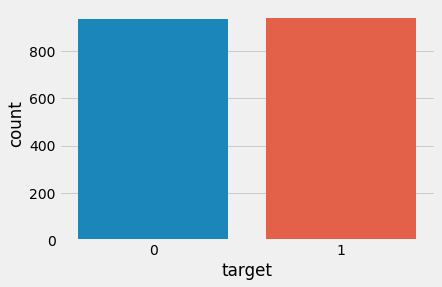

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino
print(pd.Series(y_train_full).value_counts())
sbn.countplot(y_train_full);

In [ ]:
random_under_sampler = RandomUnderSampler()
x_train_full, y_train_full = random_under_sampler.fit_sample(x_train_full, y_train_full)

1    935
0    935
dtype: int64


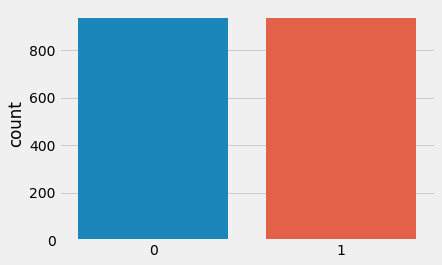

In [ ]:
#Verificando a quantidade de cada target no conjunto de treino, após a aplicação do método random under sampler
print(pd.Series(y_train_full).value_counts())
sbn.countplot(y_train_full);

**TESTANDO OS MODELOS COM TODAS AS VARIÁVEIS (FEATURES)**



*   **RESULTADO**: DECISION TREE - USANDO TODAS AS VARIÁVEIS.



In [ ]:
model_tree = treinar_tree_grid(x_train_full, y_train_full) 

TREE - GRID SEARCH - MELHOR CONFIG: {'criterion': 'gini', 'max_depth': 5}


In [ ]:
get_acuracia(model_tree, x_test_full, y_test_full)

| ACURACIA = 0.856000 | KAPPA = 0.711683 |


*   **RESULTADO**: RANDOM FOREST - USANDO TODAS AS VARIÁVEIS.

In [ ]:
model_rf = treinar_rf_grid(x_train_full, y_train_full)

RF - GRID SEARCH - MELHOR CONFIG: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 100}


In [ ]:
get_acuracia(model_rf, x_test_full, y_test_full)

| ACURACIA = 0.912000 | KAPPA = 0.823816 |


*   **RESULTADO**: SVC - USANDO TODAS AS VARIÁVEIS.

In [ ]:
model_svc = treinar_svc_grid(x_train_full, y_train_full)

SVC - GRID SEARCH - MELHOR CONFIG: {'C': 2, 'gamma': 1, 'kernel': 'rbf'}


In [ ]:
get_acuracia(model_svc, x_test_full, y_test_full)

| ACURACIA = 0.924800 | KAPPA = 0.849426 |


#REGRESSAO_Q1.CSV

In [ ]:
#Abrindo o dataset regressao_Q1.csv
df_quatro = abrir_dataset('regressao_Q1.csv', ',')

In [ ]:
visualizar_tipo(df_quatro)

,0
v_1,float64
v_2,float64
v_3,float64
v_4,float64
v_5,float64
v_6,float64
v_7,float64
v_8,float64
v_9,float64
v_10,float64


Como pode ser obervado, todas as variáveis e o target são do tipo float.

In [ ]:
#Verificando se existem valores nulos.
verificar_nulos(df_quatro)

,0
v_1,0
v_2,0
v_3,0
v_4,0
v_5,0
v_6,0
v_7,0
v_8,0
v_9,0
v_10,0


Não existem valores nulos

In [ ]:
#Tabela de percentis, visando uma melhor melhor análise dos dados.
df_quatro.describe(percentiles=[0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99])

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,target
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3.000000e+03
mean,-0.013728,0.009206,-0.029384,-0.004629,-0.005511,-0.002213,-0.007776,0.003612,-0.030677,-0.002272,1.889230e-17
std,1.013999,0.990784,0.998614,0.996142,0.985103,0.981666,1.010602,0.986319,1.012891,0.981596,1.000000e+00
min,-3.496080,-3.453640,-4.081270,-3.766640,-3.421460,-3.260670,-3.654440,-2.884670,-4.155540,-3.427620,-3.357607e+00
25%,-0.711340,-0.638552,-0.711815,-0.666995,-0.659383,-0.667800,-0.666790,-0.666575,-0.697043,-0.672955,-6.622003e-01
50%,-0.046020,0.012220,-0.019675,-0.015435,0.010430,-0.013930,-0.002905,0.007020,-0.038160,-0.002770,-3.132741e-02
75%,0.659350,0.666660,0.643775,0.658895,0.654602,0.658930,0.656767,0.670165,0.634060,0.651572,6.708735e-01
80%,0.842608,0.854744,0.821622,0.830678,0.810772,0.828322,0.837184,0.828606,0.813134,0.832218,8.183081e-01
90%,1.301536,1.256613,1.241207,1.282302,1.256225,1.245369,1.272269,1.271932,1.282759,1.258923,1.287875e+00
95%,1.714258,1.631229,1.574672,1.597194,1.637268,1.629073,1.624719,1.643897,1.624014,1.599211,1.680898e+00


Pelos percentis não foi possível identificar outiliers.

**PREPARANDO O CONJUNTO DE TREINO E TESTE**

In [ ]:
y_regression_um = df_quatro['target']
df_quatro.drop(columns=['target'], inplace=True)
x_regression_um = df_quatro.iloc[:,:]
variaveis_regression_um = df_quatro.columns

In [ ]:
x_train_regression_um, x_test_regression_um, y_train_regression_um, y_test_regression_um = train_test_split(x_regression_um, y_regression_um, test_size = 0.25)

**TESTANDO O LASSO:** O LAÇO FOI ESCOLHIDO PORQUE PERMITE IDENTIFICAR A IMPORTÂNCIA DAS VARIÁVEIS NA PREDIÇÃO.

In [ ]:
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005], max_iter=20000, cv=5).fit(x_train_regression_um, y_train_regression_um)

In [ ]:
#RMSE NO CONJUNTO DE TREINO
get_rmse(model_lasso, x_train_regression_um, y_train_regression_um)

RMSE = 0.000896


In [ ]:
#RMSE NO CONJUNTO DE TESTE
get_rmse(model_lasso, x_test_regression_um, y_test_regression_um)

RMSE = 0.000924


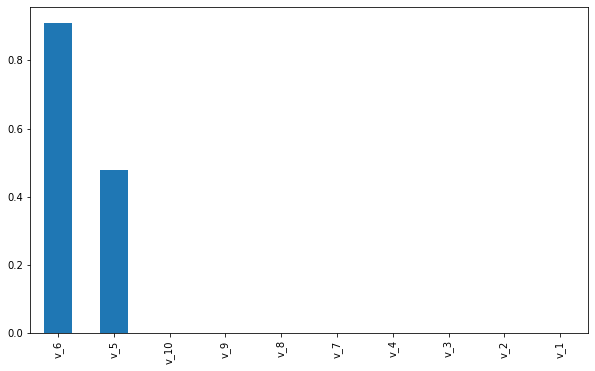

In [ ]:
#VISUALIZANDO A IMPORTÂNCIA DE CADA VARIÁVEL NA PREDIÇÃO
coeficientes = pd.Series(model_lasso.coef_, variaveis_regression_um)
coeficientes.sort_values(inplace = True,  ascending=False)
coeficientes.plot(kind = "bar")

Foi possível observar que as variáveis v_5 e v_6 possuem maior importância na predição. Já as demais variáveis, possuem um peso muito baixo na predição.

**TESTANDO O LAÇO APENAS COM AS VARIÁVEIS (v_5 e v_6) QUE APRESENTARAM MAIOR IMPORTÂNCIA DA PREDIÇÃO**

In [ ]:
df_quatro = abrir_dataset('regressao_Q1.csv', ',')
y_dois = pd.DataFrame({'target':df_quatro['target']})
x_dois = pd.DataFrame({'v_5':df_quatro['v_5'], 'v_6':df_quatro['v_6']})

In [ ]:
x_train_dois, x_test_dois, y_train_dois, y_test_dois = train_test_split(x_dois, y_dois, test_size = 0.25)

In [ ]:
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005], max_iter=20000, cv=5).fit(x_train_dois, y_train_dois)

In [ ]:
#RMSE NO CONJUNTO DE TREINO - USANDO APENAS AS VARIÁVEIS v_5 e v_6
get_rmse(model_lasso, x_train_dois, y_train_dois)

RMSE = 0.000890


In [ ]:
#RMSE NO CONJUNTO DE TESTE - USANDO APENAS AS VARIÁVEIS v_5 e v_6
get_rmse(model_lasso, x_test_dois, y_test_dois)

RMSE = 0.000876


**CONCLUSÃO:** Usando apenas duas variáveis foi possível alcançar um rmse um pouco menor. Embora a diferença tenha sido pequena em relação a usar todas as variáveis, uma vantagem de usar apenas as variáveis importante é reduzir o tempo de processamento dos dados.

**VERIFICANDO SE A NORMALIZAÇÃO DOS DADOS REDUZ O ERRO**

In [ ]:
#Normalizando os dados de x e y do treino e do teste.
x_train_dois, x_test_dois = normalizar_dados(df_quatro, x_train_dois, x_test_dois, 'a')
y_train_dois, y_test_dois = normalizar_dados(df_quatro, y_train_dois, y_test_dois, 'a')

In [ ]:
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005], max_iter=20000, cv=5).fit(x_train_dois, y_train_dois)

In [ ]:
#RMSE NO CONJUNTO DE TREINO - USANDO APENAS AS VARIÁVEIS v_5 e v_6 - COM A NORMALIZAÇÃO
get_rmse(model_lasso, x_train_dois, y_train_dois)

RMSE = 0.002577


In [ ]:
#RMSE NO CONJUNTO DE TESTE - USANDO APENAS AS VARIÁVEIS v_5 e v_6 - COM A NORMALIZAÇÃO
get_rmse(model_lasso, x_test_dois, y_test_dois)

RMSE = 0.002494


Foi possível observar que a **normalização proporcionou uma redução da raiz do erro quadrático médio**, tanto no treino quanto no teste.

**TESTANDO O MODELO DE REGRESSÃO LINEAR RIDGE**

Através dos testes com o LASSO, foi possível indentificar as variáveis importantes para mensurar a saída e, também, constatar que a normalização foi importante para diminuir o erro. Então, essas estratégias serão consideradas para realizar o teste com o ridge.

In [ ]:
#TESTANDO DIFERENTES VALORES DE ALFA, VISANDO A ESCOLHA DO MELHOR.
rmse = []
lista_alphas = [0.001, 0.01, 0.2, 0.3, 0.4, 0.5, 1, 2, 3, 4, 5]
for value_alpha in lista_alphas:
    erro = np.sqrt(-cross_val_score(Ridge(alpha=value_alpha), x_train_dois, y_train_dois, scoring="neg_mean_squared_error", cv = 5))
    rmse.append( erro.mean() )

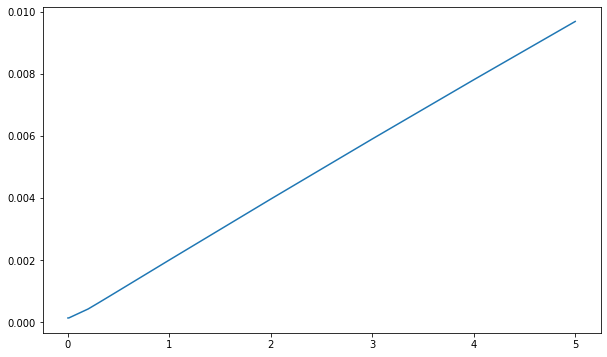

In [ ]:
plt.plot(alphas, rmse)

O gráfico mostra que o valor de alfa igual a 0.001 foi o melhor. Portanto, o mesmo será considerado nos testes seguintes.

In [ ]:
model_ridge = Ridge(alpha=0.001)

In [ ]:
model_ridge.fit(x_train_dois, y_train_dois)

Ridge(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [ ]:
#RMSE E MAE NO CONJUNTO DE TREINO
get_rmse(model_ridge, x_train_dois, y_train_dois)

| RMSE = 0.000133 | MAE = 0.000106 |


In [ ]:
#RMSE E MAE NO CONJUNTO DE TESTE
get_rmse(model_ridge, x_test_dois, y_test_dois)

| RMSE = 0.000135 | MAE = 0.000107 |


***A regressão linear ridge*** apresentou um menor erro em comparação ao lasso. No entanto, vale ressaltar que **o lasso foi muito importante para que decisões pudessem ser tomadas** e, em seguida, aproveitadas com o ridge.

#5 - REGRESSAO_Q2.CSV

In [ ]:
#Abrindo o dataset regressao_Q2.csv
df_cinco = abrir_dataset('regressao_Q2.csv', ',')

In [ ]:
visualizar_tipo(df_cinco)

,0
v_1,float64
v_2,float64
v_3,float64
v_4,float64
v_5,float64
v_6,float64
v_7,float64
v_8,float64
v_9,float64
v_10,float64


Como pode ser obervado, todas as variáveis e o target são do tipo float.

In [ ]:
#Verificando se existem valores nulos.
verificar_nulos(df_cinco)

,0
v_1,0
v_2,0
v_3,0
v_4,0
v_5,0
v_6,0
v_7,0
v_8,0
v_9,0
v_10,0


Não existem valores nulos

In [ ]:
#Tabela de percentis, visando uma melhor melhor análise dos dados.
df_cinco.describe(percentiles=[0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99])

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,target
count,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000
mean,0.010030,-0.060168,0.009921,-0.010504,0.000397,-0.006430,0.015629,0.000075,-0.001657,0.000290,-0.023323,0.018136,0.555105
std,0.998695,0.987547,1.003915,1.015696,1.006447,0.979081,1.000192,1.005445,1.009637,1.005458,1.008678,1.008743,143.720826
min,-3.974510,-3.613150,-3.558150,-3.613370,-3.065630,-2.968330,-3.355500,-3.682700,-3.770810,-3.978460,-3.614730,-4.087600,-471.528079
25%,-0.624668,-0.713672,-0.667495,-0.697965,-0.694120,-0.678975,-0.651733,-0.669007,-0.678168,-0.691798,-0.698605,-0.630763,-96.214263
50%,-0.011855,-0.048880,0.030565,-0.008475,-0.003535,-0.016775,0.028450,-0.005685,0.001500,0.017255,0.003330,0.022010,0.217178
75%,0.642370,0.595178,0.689033,0.670802,0.669773,0.648637,0.695678,0.719817,0.672082,0.675290,0.669048,0.703172,97.602166
80%,0.825004,0.753200,0.843986,0.842202,0.855764,0.811108,0.855294,0.862076,0.833630,0.835064,0.838618,0.855270,120.534606
90%,1.285168,1.212672,1.280124,1.293983,1.293830,1.237678,1.326006,1.258560,1.303394,1.284611,1.258303,1.310087,188.720511
95%,1.677670,1.570117,1.617298,1.659810,1.641417,1.633734,1.659047,1.612113,1.680890,1.639566,1.606086,1.661309,242.429945


Pelos percentis, não foi possível identificar a existência de outiliers. No entanto, **existe uma grande diferença entre os targets**, que pode ser uma característica do conjunto de dados. Pode ser alguma pontuação associada à clientes, com base nas variáveis preditivas. Contudo, não tenho essa informação e não posso tirar conclusões precipitadas. Posteriormente, isso será investigado!

**PREPARANDO O CONJUNTO DE TREINO E TESTE**

In [ ]:
y_regression_dois = df_cinco['target']
df_cinco.drop(columns=['target'], inplace=True)
x_regression_dois = df_cinco.iloc[:,:]
variaveis_regression_dois = df_cinco.columns

In [ ]:
x_train_regression_dois, x_test_regression_dois, y_train_regression_dois, y_test_regression_dois = train_test_split(x_regression_dois, y_regression_dois, test_size = 0.25)

**TESTANDO O LASSO:** O LAÇO FOI ESCOLHIDO PORQUE PERMITE IDENTIFICAR A IMPORTÂNCIA DAS VARIÁVEIS NA PREDIÇÃO.

In [ ]:
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005], max_iter=20000, cv=5).fit(x_train_regression_dois, y_train_regression_dois)

In [ ]:
#RMSE E MAE NO CONJUNTO DE TREINO
get_rmse(model_lasso, x_train_regression_dois, y_train_regression_dois)

| RMSE = 0.077021 | MAE = 0.061502 |


In [ ]:
#RMSE NO CONJUNTO DE TESTE
get_rmse(model_lasso, x_test_regression_dois, y_test_regression_dois)

| RMSE = 0.082152 | MAE = 0.064864 |


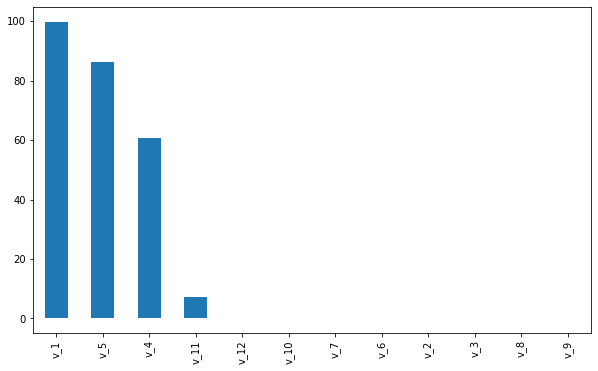

In [ ]:
#VISUALIZANDO A IMPORTÂNCIA DE CADA VARIÁVEL NA PREDIÇÃO
coeficientes = pd.Series(model_lasso.coef_, variaveis_regression_dois)
coeficientes.sort_values(inplace = True,  ascending=False)
coeficientes.plot(kind = "bar")

Foi possível observar que as variáveis v_1, v_5, v_4 possuem maior importância na predição. A variavél v_11 também possui um certa importância, porém é menor em comparação às variáveis citadas anteriormente. As demais variáveis, possuem um peso muito baixo na predição.

**TESTANDO O LAÇO APENAS COM AS VARIÁVEIS (v_1, v_5, v_4 e v_11) QUE APRESENTARAM MAIOR IMPORTÂNCIA DA PREDIÇÃO**

In [ ]:
df_cinco = abrir_dataset('regressao_Q2.csv', ',')
y_quatro = pd.DataFrame({'target':df_cinco['target']})
x_quatro = pd.DataFrame({'v_1':df_cinco['v_1'], 'v_5':df_cinco['v_5'], 'v_4':df_cinco['v_4'], 'v_11':df_cinco['v_11']})

In [ ]:
x_train_quatro, x_test_quatro, y_train_quatro, y_test_quatro = train_test_split(x_quatro, y_quatro, test_size = 0.25)

In [ ]:
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005], max_iter=20000, cv=5).fit(x_train_quatro, y_train_quatro)

In [ ]:
#RMSE E MAE NO CONJUNTO DE TREINO - USANDO APENAS AS VARIÁVEIS v_1, v_5, v_4 e v_11
get_rmse(model_lasso, x_train_quatro, y_train_quatro)

| RMSE = 0.077409 | MAE = 0.061364 |


In [ ]:
#RMSE E MAE NO CONJUNTO DE TESTE - USANDO APENAS AS VARIÁVEIS v_1, v_5, v_4 e v_11
get_rmse(model_lasso, x_test_quatro, y_test_quatro)

| RMSE = 0.081194 | MAE = 0.065608 |


**CONCLUSÃO:** Usando apenas quatro variáveis foi possível alcançar raiz do erro quadrático médio e erro médio absoluto, semelhantes aos resultados alcançados com todas as variáveis, com a vantagem da redução dotempo de processamento dos dados.

**VERIFICANDO SE A NORMALIZAÇÃO DOS DADOS REDUZ O ERRO**

In [ ]:
#Normalizando os dados de x e y do treino e do teste.
x_train_quatro, x_test_quatro = normalizar_dados(df_cinco, x_train_quatro, x_test_quatro, 'a')
y_train_quatro, y_test_quatro = normalizar_dados(df_cinco, y_train_quatro, y_test_quatro, 'a')

In [ ]:
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005], max_iter=20000, cv=5).fit(x_train_quatro, y_train_quatro)

In [ ]:
#RMSE E MAE NO CONJUNTO DE TREINO - USANDO APENAS AS VARIÁVEIS v_1, v_5, v_4 e v_11 - COM A NORMALIZAÇÃO
get_rmse(model_lasso, x_train_quatro, y_train_quatro)

| RMSE = 0.003654 | MAE = 0.002933 |


In [ ]:
#RMSE E MAE NO CONJUNTO DE TESTE - USANDO APENAS AS VARIÁVEIS v_1, v_5, v_4 e v_11 - COM A NORMALIZAÇÃO
get_rmse(model_lasso, x_test_quatro, y_test_quatro)

| RMSE = 0.003804 | MAE = 0.002998 |


Foi possível observar que a **normalização proporcionou uma redução da raiz do erro quadrático médio** e **erro médio absoluto**, tanto no treino quanto no teste.

**TESTANDO O MODELO DE REGRESSÃO LINEAR RIDGE**

Através dos testes com o LASSO, foi possível indentificar as variáveis importantes para mensurar a saída e, também, constatar que a normalização foi importante para diminuir o erro. Então, essas estratégias serão consideradas para realizar o teste com o ridge.

In [ ]:
#TESTANDO DIFERENTES VALORES DE ALFA, VISANDO A ESCOLHA DO MELHOR.
rmse = []
lista_alphas = [0.001, 0.01, 0.2, 0.3, 0.4, 0.5, 1, 2, 3, 4, 5]
for value_alpha in lista_alphas:
    erro = np.sqrt(-cross_val_score(Ridge(alpha=value_alpha), x_train_quatro, y_train_quatro, scoring="neg_mean_squared_error", cv = 5))
    rmse.append( erro.mean() )

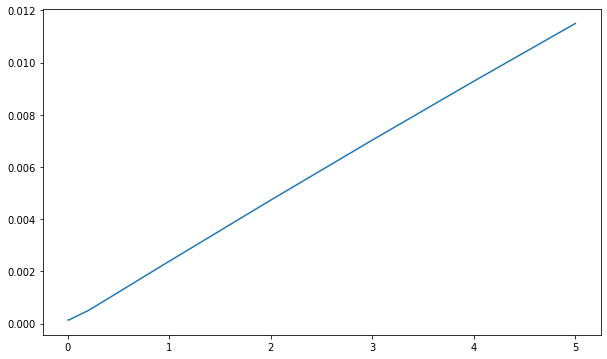

In [ ]:
plt.plot(alphas, rmse)

O gráfico mostra que o valor de alfa igual a 0.001 foi o melhor. Portanto, o mesmo será considerado nos testes seguintes.

In [ ]:
model_ridge = Ridge(alpha=0.001)

In [ ]:
model_ridge.fit(x_train_quatro, y_train_quatro)

Ridge(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [ ]:
#RMSE E MAE NO CONJUNTO DE TREINO
get_rmse(model_ridge, x_train_quatro, y_train_quatro)

| RMSE = 0.000139 | MAE = 0.000110 |


In [ ]:
#RMSE E MAE NO CONJUNTO DE TESTE
get_rmse(model_ridge, x_test_quatro, y_test_quatro)

| RMSE = 0.000146 | MAE = 0.000118 |


***A regressão linear ridge*** apresentou um menor erro em comparação ao lasso. Contudo, o lasso foi muito importante para a escolha das variáveis importantes.

**UTILIZANDO ÁRVORE DE REGRESSÃO**

In [ ]:
scoring = make_scorer(r2_score)
dtr_grid = GridSearchCV(tree.DecisionTreeRegressor(random_state=0), param_grid={'min_samples_split': range(2, 10)}, scoring=scoring, cv=5, refit=True)
dtr_grid.fit(x_train_quatro, y_train_quatro)
print("DECISION TREE REGRESSOR - GRID SEARCH - MELHOR CONFIG: " + str(dtr_grid.best_params_))
model_decision_tree_regressor = dtr_grid.best_estimator_

DECISION TREE REGRESSOR - GRID SEARCH - MELHOR CONFIG: {'min_samples_split': 3}


In [ ]:
#RMSE E MAE NO CONJUNTO DE TREINO
get_rmse(model_decision_tree_regressor, x_train_quatro, y_train_quatro)

| RMSE = 0.008304 | MAE = 0.003947 |


In [ ]:
#RMSE E MAE NO CONJUNTO DE TESTE
get_rmse(model_decision_tree_regressor, x_test_quatro, y_test_quatro)

| RMSE = 0.064926 | MAE = 0.047332 |


**CONCLUSÃO:** A regressão linear ridge apresentou a menor raiz do erro quadrático médio e, também, o menor erro quadrático médio absoluto.

Embora as questões tenham pedido coisas específicas, com base em minhas experiências técnicas e científicas, tomei a decisão de realizar procedimentos que acreditava ser melhores para alcançar bons resultados, provando que as técnicas utilizadas foram eficientes. Claro, se estive em uma equipe de ciência de dados, estas decisões seriam tomadas em conjunto com a equipe. 


**Utilizei modelos mais simples, pois identifiquei que os problemas não são muito complexos.** Além disso, quando existe restrição de tempo, modelos mais simples tendem a ser mais rápidos, já que possuem menos parâmetros e complexide. 